## Set up...

In [18]:
#Base libraries for interactive work
import numpy as np #We will make extensive use of Numpy arrays 
import multiprocessing as mp #Enable multiprocessing
from tqdm import notebook #For monitoring process of big jobs
from astropy.io import fits #astropy modules for FITS IO

#Based libraries for iPython Plots
import matplotlib  #ploting
matplotlib.use("Agg")  #some hack to stop the bouncing python icon when plotting of os/x
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm #for better display of FITS images
import time as t
import os
%matplotlib inline

import neossat as neo  #Main Python Libs for NEOSSat processing.  

def barupdate(result):
    pbar.update()

In [3]:
## For Debugging
#importlib.reload(neo)  #Re-loading is for development purposes only - you don't need to run this. 

In [52]:
workdir='C:/Users/nczirankacrooks/Documents/DevWork/NEOSSat/inputs/'  #Directory that contains all your FITS files (both lights and darks)
savedir="C:/Users/nczirankacrooks/Documents/DevWork/NEOSSat/outputs/" #Directory to save cleaned images. 

bpix=-1.0e10                   #value to mark bad pixels. Any pixel *below* bpix is considered invalid.

#--- Raster info ---#
xsc=1020 #height of science raster (light or dark)
ysc=1078 #width of science raster
xov=1020 #height of overscan.  xov must equal xsc
yov=16 #width of overscan

#--- Parameters for Fourier Decomp. ---#
snrcut=10.0  #When to stop decomposition 
fmax=2 #Maximum number of frequencies in model
xoff=0 #pixel offsets 
yoff=0
T=8 #Oversampling
info=0 # 0 - no plots, no output, 1 - no plots, output, 2 - plots, output

imagefiles=[]
for filename in os.listdir(workdir):
    if os.path.isfile(os.path.join(workdir, filename)) and filename.endswith('.fits'):
        imagefiles.append(filename)

## Get list of Dark Images

In [44]:
darklist=[]
nfiles=len(imagefiles)
for i in range(nfiles):
    filename=workdir+imagefiles[i]
    hdulist = fits.open(filename)
    shutter=hdulist[0].header['SHUTTER']
    if int(shutter[0]) != 0:  #Check if shutter was open or closed.
        darklist.append(imagefiles[i])
    hdulist.close()
print("Number of dark images: ",len(darklist))

Number of dark images:  10


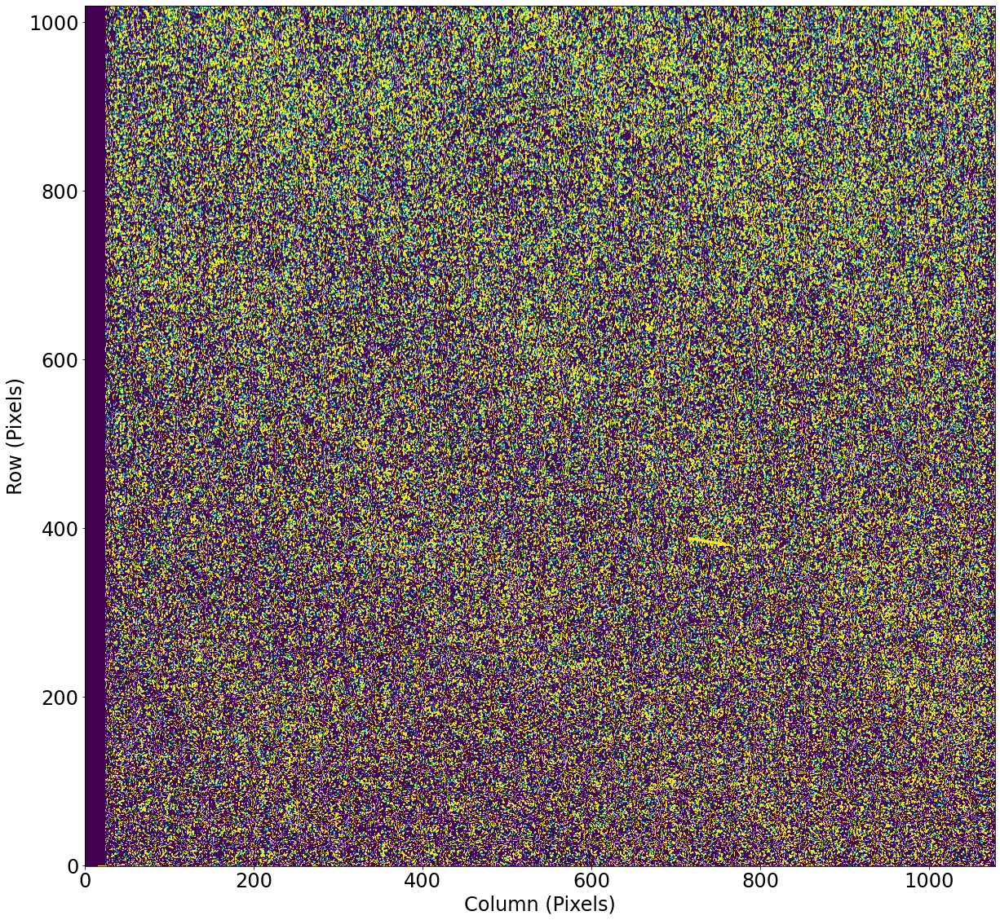

In [45]:
#Lets see an image to confirm settings are corrrect for overscan and science subrasters
image=neo.read_fitsdata(workdir+darklist[0])
imstat=neo.imagestat(image,bpix)
neo.plot_image(image,imstat,0.1,1.5)

## Process the Dark Images.  

Overscan and bias corrections are applied.

In [53]:
pbar = notebook.tqdm(total=len(darklist))  #Will make a progressbar to monitor processing.  
pool = mp.Pool(processes=24)  #Use lots of threads - because we can! 
results = [pool.apply_async(neo.darkprocess, args=(workdir,darkfile,xsc,ysc,xov,yov,snrcut,fmax,xoff,yoff,T,\
                bpix,),callback=barupdate) for darkfile in darklist]
alldarkdata = [p.get() for p in results]
pool.close()
pool.join()

  0%|          | 0/10 [00:00<?, ?it/s]

In [8]:
## Tasks to clean up multiprocessing if it is aborted.  
#pool.close()
#pool.terminate()
#pool.join()

## Combine Darks  

Darks are scaled to match each other

In [54]:
darkavg = neo.combinedarks(alldarkdata, darkmode='logspace', pixfrac=0.1)

## Display Master Dark

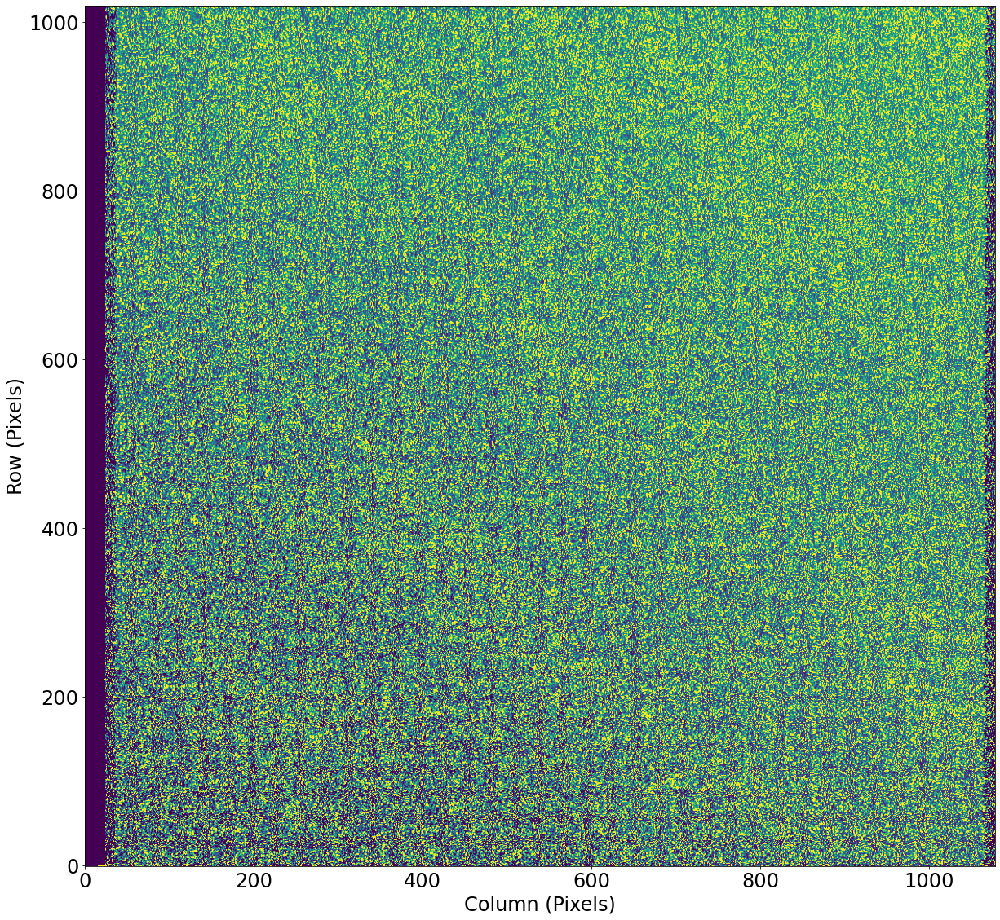

In [55]:
imstat=neo.imagestat(darkavg,bpix)
neo.plot_image(darkavg,imstat,1.0,3.0)

## If we are happy with the Master dark, then clean up workspace

In [11]:
alldarkdata = []

## Get List of Light Images

In [49]:
lightlist=[]
jddate=[]
exptime=[]
nfiles=len(imagefiles)
for i in range(nfiles):
    filename=workdir+imagefiles[i]
    hdulist = fits.open(filename)
    shutter=hdulist[0].header['SHUTTER']
    mode=hdulist[0].header['MODE']
    #print(mode[0:2],imagefiles[i])
    if (int(shutter[0]) == 0) & (int(mode[0:2]) == 16):  #Check if shutter was open or closed.
        lightlist.append(imagefiles[i])
        jddate.append(float(hdulist[0].header['JD-OBS']))
        exptime.append(float(hdulist[0].header['EXPOSURE']))
    hdulist.close()
jddate=np.array(jddate)
exptime=np.array(exptime)
print("number of images: ",len(lightlist))

number of images:  10


C:/Users/nczirankacrooks/Documents/DevWork/NEOSSat/inputs/NEOS_SCI_2024009051043.fits


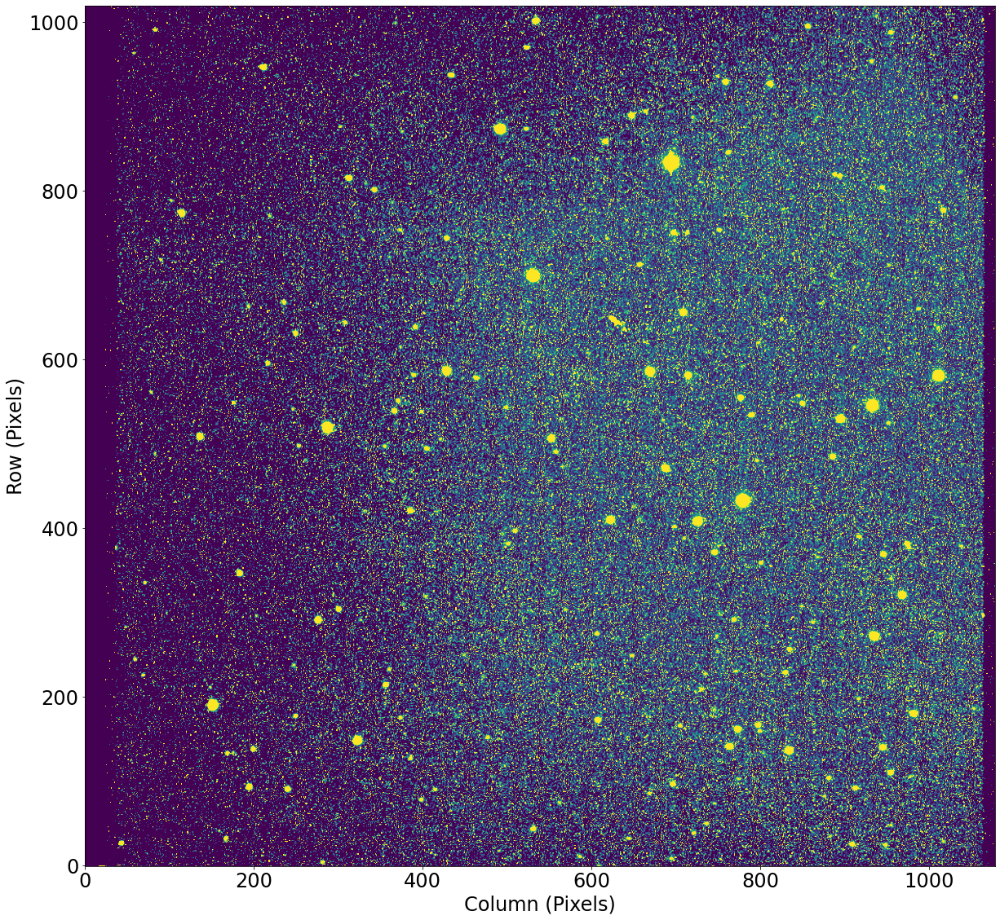

In [56]:
#Lets see a raw "light" image to see what the image looks like before being cleaned
image=neo.read_fitsdata(workdir+lightlist[5])
print(workdir+lightlist[5])
imstat=neo.imagestat(image,bpix)
neo.plot_image(image,imstat,0.3,3.0)

## Process a light Image  

Then plot it..

C:/Users/nczirankacrooks/Documents/DevWork/NEOSSat/inputs/NEOS_SCI_2024009051043.fits


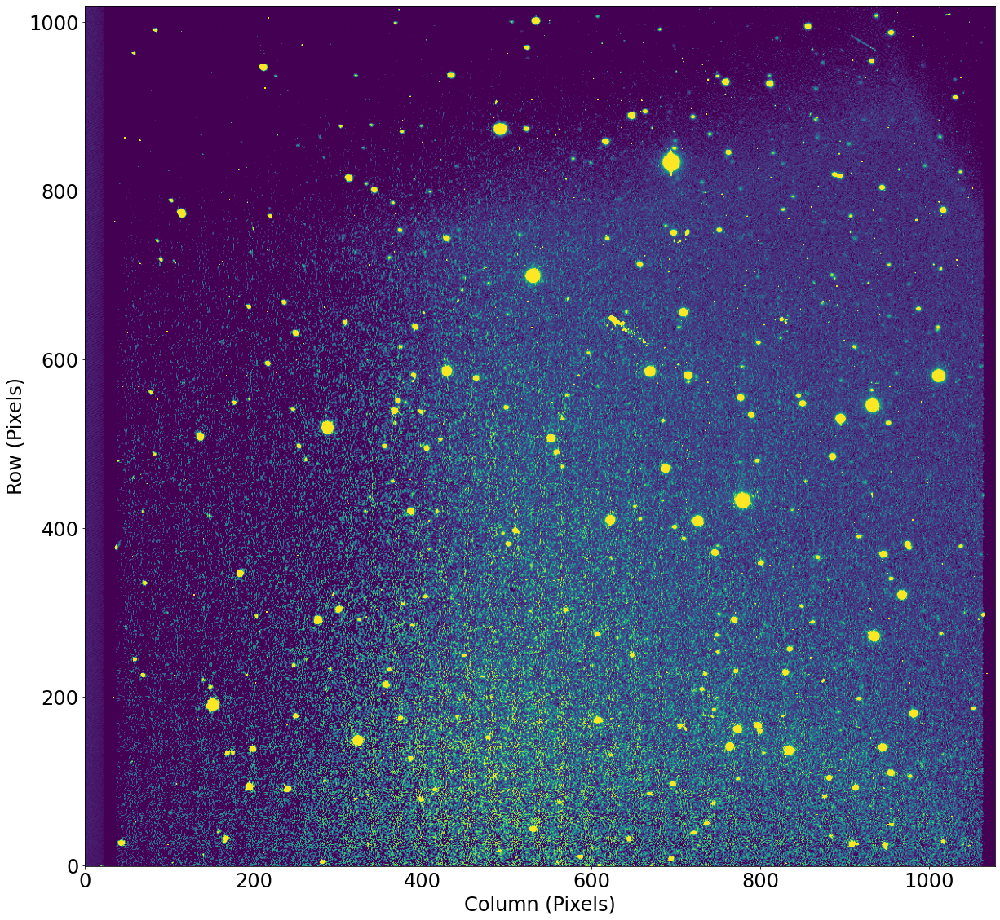

In [57]:
filename=workdir+lightlist[5]
print(filename)
scidata_cord=\
  neo.clean_sciimage(filename,darkavg,xsc,ysc,xov,yov,snrcut,fmax,xoff,yoff,T,info,bpix,'logspace')

imstat=neo.imagestat(scidata_cord,bpix)
neo.plot_image(scidata_cord,imstat,0.3,3.0)

## Batch process and save cleaned images

In [58]:
pbar = notebook.tqdm(total=len(lightlist))  #Progress bar.
pool = mp.Pool(processes=24)  #How many threads to use.
results = [pool.apply_async(neo.lightprocess_save, args=(workdir+lightlist[i],savedir,darkavg,xsc,ysc,xov,yov,\
           snrcut,fmax,xoff,yoff,T,bpix,'logspace'),callback=barupdate)\
           for i in range(len(lightlist))]
saveall = [p.get() for p in results]
pool.close()
pool.join()

  0%|          | 0/10 [00:00<?, ?it/s]

In [15]:
print("All done..")

All done..


In [24]:
## Tasks to clean up multiprocessing if it is aborted.  
#pool.close()
#pool.terminate()
#pool.join()